<a href="https://colab.research.google.com/github/Maheshkarthick-github/Deep-Learning-Based-Intrusion-Detection/blob/main/ml_proj_cnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import os, re, time, math, tqdm, itertools
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.neural_network import MLPClassifier
import keras
from keras.layers import Conv2D, Conv1D, MaxPooling2D, MaxPooling1D, Flatten, BatchNormalization, Dense
from keras.utils import to_categorical
from keras.models import Sequential
from keras.callbacks import CSVLogger, ModelCheckpoint

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
network_data=pd.read_csv('/content/drive/MyDrive/CICIDS_2018.csv')

<ipython-input-3-6fd60bd8b3ce>:1: DtypeWarning:

Columns (0,1,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78) have mixed types. Specify dtype option on import or set low_memory=False.



In [ ]:
network_data.shape

(828424, 80)

In [ ]:
print('Number of Rows (Samples): %s' % str((network_data.shape[0])))
print('Number of Columns (Features): %s' % str((network_data.shape[1])))

Number of Rows (Samples): 828424
Number of Columns (Features): 80


We have a total of **8 lakhs+** samples and **80** features in data.




In [ ]:
network_data.head(4)

,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,57610,6,02/03/2018 04:14:05,25,2,0,0,0.0,0,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
1,52347,6,02/03/2018 02:48:44,63,3,1,31,0.0,31,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
2,55970,6,16/02/2018 01:46:19,4217799,5,3,935,350.0,935,0,...,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
3,80,6,02/03/2018 05:17:21,54499550,2,0,0,0.0,0,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign


In [ ]:
network_data.columns

Index(['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts',
       'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max',
       'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
       'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean',
       'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean',
       'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags',
       'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s',
       'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean',
       'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt',
       'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt',
       'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg',
      

In [ ]:
print('Total columns in our data: %s' % str(len(network_data.columns)))

Total columns in our data: 80


The dataset is huge. We have a total of **80** columns in our data.

In [ ]:
network_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828424 entries, 0 to 828423
Data columns (total 80 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Dst Port           828424 non-null  object
 1   Protocol           828424 non-null  object
 2   Timestamp          828424 non-null  object
 3   Flow Duration      828424 non-null  object
 4   Tot Fwd Pkts       828424 non-null  object
 5   Tot Bwd Pkts       828424 non-null  object
 6   TotLen Fwd Pkts    828424 non-null  object
 7   TotLen Bwd Pkts    828424 non-null  object
 8   Fwd Pkt Len Max    828424 non-null  object
 9   Fwd Pkt Len Min    828424 non-null  object
 10  Fwd Pkt Len Mean   828424 non-null  object
 11  Fwd Pkt Len Std    828424 non-null  object
 12  Bwd Pkt Len Max    828424 non-null  object
 13  Bwd Pkt Len Min    828424 non-null  object
 14  Bwd Pkt Len Mean   828424 non-null  object
 15  Bwd Pkt Len Std    828424 non-null  object
 16  Flow Byts/s        8

The following information tells us that:
* We have a huge amount of data, containing **8 lakhs+** entries (samples)
* There are a total of **80** columns belinging to each sample
* There are missing values in our data, which need to be filled or dropped for proper modelling


In [ ]:
# check the number of values for labels
network_data['Label'].value_counts()

,count
Label,
Benign,611216
DDOS attack-HOIC,68601
DoS attacks-Hulk,46191
Bot,28619
FTP-BruteForce,19336
SSH-Bruteforce,18759
Infilteration,16193
DoS attacks-SlowHTTPTest,13989
DoS attacks-GoldenEye,4151


Most of the network intrusions in our data are benign, as output from above code cell.

**Data visualisation**


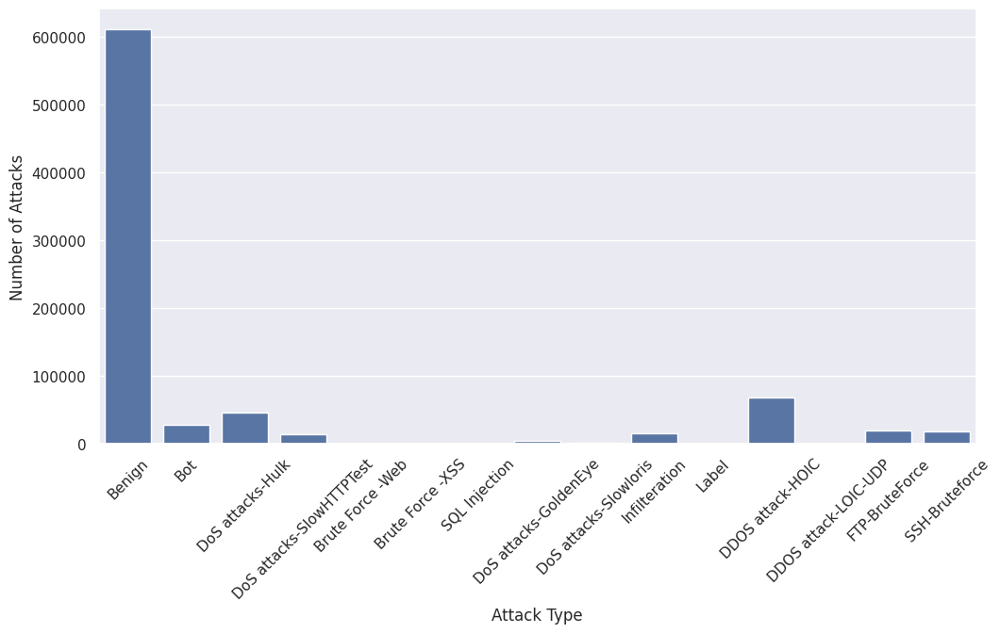

In [ ]:
sns.set(rc={'figure.figsize':(12, 6)})
plt.xlabel('Attack Type')
sns.set_theme()
ax = sns.countplot(x='Label', data=network_data)
ax.set(xlabel='Attack Type', ylabel='Number of Attacks')
plt.xticks(rotation=45)  # Rotate labels
plt.show()


In [ ]:
pyo.init_notebook_mode()
fig = px.scatter(x = network_data["Bwd Pkts/s"][:100000],
                 y=network_data["Fwd Seg Size Min"][:100000])
fig

CPU times: user 1.95 s, sys: 50.7 ms, total: 2 s
Wall time: 2.1 s


<Axes: xlabel='Bwd Pkts/s', ylabel='Fwd Seg Size Min'>

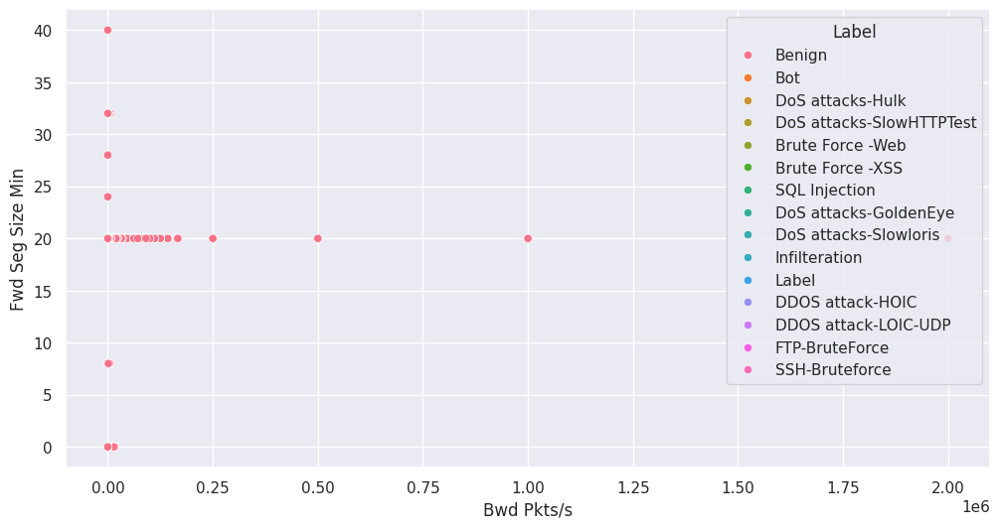

In [ ]:
%%time
sns.set(rc={'figure.figsize':(12, 6)})
sns.scatterplot(x=network_data['Bwd Pkts/s'][:50000], y=network_data['Fwd Seg Size Min'][:50000],
                hue='Label', data=network_data)

In [ ]:
# check the dtype of timestamp column
(network_data['Timestamp'].dtype)

dtype('O')

Data **Preprocessing**

In [ ]:
# check for some null or missing values in our dataset
network_data.isna().sum().to_numpy()

array([   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0, 2352,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0])

In [ ]:
# drop null or missing columns
cleaned_data = network_data.dropna()
cleaned_data.isna().sum().to_numpy()

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

Label **Encoding**

In [ ]:
# encode the column labels
label_encoder = LabelEncoder()
cleaned_data['Label']= label_encoder.fit_transform(cleaned_data['Label'])
cleaned_data['Label'].unique()

<ipython-input-17-c0bdb82b1f12>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



array([ 0,  1,  7,  8,  2,  3, 13,  6,  9, 11, 12,  4,  5, 10, 14])

In [ ]:
# check for encoded labels
cleaned_data['Label'].value_counts()

,count
Label,
0,608967
4,68601
7,46191
1,28619
10,19336
14,18759
11,16090
8,13989
6,4151


**Shaping** the data for CNN

In [ ]:
data_1 = cleaned_data[cleaned_data['Label'] == 0]  # Benign
data_2 = cleaned_data[cleaned_data['Label'] == 1]  # DDOS attack-HOIC
data_3 = cleaned_data[cleaned_data['Label'] == 2]  # DoS attacks-Hulk
data_4 = cleaned_data[cleaned_data['Label'] == 3]  # Bot
data_5 = cleaned_data[cleaned_data['Label'] == 4]  # FTP-BruteForce
data_6 = cleaned_data[cleaned_data['Label'] == 5]  # SSH-Bruteforce
data_7 = cleaned_data[cleaned_data['Label'] == 6]  # Infiltration
data_8 = cleaned_data[cleaned_data['Label'] == 7]  # DoS attacks-SlowHTTPTest
y_1 = np.zeros(data_1.shape[0])    # Label for Benign
y_2 = np.ones(data_2.shape[0])     # Label for DDOS attack-HOIC
y_3 = np.full(data_3.shape[0], 2)  # Label for DoS attacks-Hulk
y_4 = np.full(data_4.shape[0], 3)  # Label for Bot
y_5 = np.full(data_5.shape[0], 4)  # Label for FTP-BruteForce
y_6 = np.full(data_6.shape[0], 5)  # Label for SSH-Bruteforce
y_7 = np.full(data_7.shape[0], 6)  # Label for Infiltration
y_8 = np.full(data_8.shape[0], 7)  # Label for DoS attacks-SlowHTTPTest

# Convert arrays to DataFrames
y_benign = pd.DataFrame(y_1)
y_hoic = pd.DataFrame(y_2)
y_hulk = pd.DataFrame(y_3)
y_bot = pd.DataFrame(y_4)
y_ftp = pd.DataFrame(y_5)
y_ssh = pd.DataFrame(y_6)
y_infil = pd.DataFrame(y_7)
y_slowhttp = pd.DataFrame(y_8)



In [ ]:
y_1, y_2, y_3,y_4,y_5,y_6,y_7,y_8

(array([0., 0., 0., ..., 0., 0., 0.]),
 array([1., 1., 1., ..., 1., 1., 1.]),
 array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]),
 array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
        3]),
 array([4, 4, 4, ..., 4, 4, 4]),
 array([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
        5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5]),
 array([

The output of above cell shows that there are no null values in our data, and the data can now be used for model fitting. We have two types of datasets, normal and abnormal, and they'll be used for model fitting.

Data **Argumentation**

In [ ]:

from sklearn.utils import resample
data_1_resample = resample(data_1, n_samples=20000, random_state=123, replace=True)
data_2_resample = resample(data_2, n_samples=20000, random_state=123, replace=True)
data_3_resample = resample(data_3, n_samples=20000, random_state=123, replace=True)
data_4_resample = resample(data_4, n_samples=20000, random_state=123, replace=True)
data_5_resample = resample(data_5, n_samples=20000, random_state=123, replace=True)
data_6_resample = resample(data_6, n_samples=20000, random_state=123, replace=True)
data_7_resample = resample(data_7, n_samples=20000, random_state=123, replace=True)
data_8_resample = resample(data_8, n_samples=20000, random_state=123, replace=True)
X = pd.concat([data_1_resample, data_2_resample, data_3_resample, data_4_resample, data_5_resample, data_6_resample, data_7_resample, data_8_resample], sort=True)
y = pd.concat([y_benign, y_hoic, y_hulk, y_bot, y_ftp, y_ssh, y_infil, y_slowhttp], sort=True)


In [ ]:
print(X.shape)
print(y.shape)
# checking if there are some null values in data
X.isnull().sum().to_numpy()

(160000, 80)
(756786, 1)


array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
train_dataset = pd.concat([data_1_resample, data_2_resample, data_3_resample,data_4_resample,data_5_resample,data_6_resample,data_7_resample,data_8_resample])
train_dataset.head(2)

,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
367627,443,6,01/03/2018 04:41:12,9313559,3,0,0,0,0,0,...,28,3206080.0,0.0,3206080,3206080,6107479.0,0.0,6107479,6107479,0
28090,445,6,02/03/2018 12:47:59,1032967,7,5,364,582.0,103,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


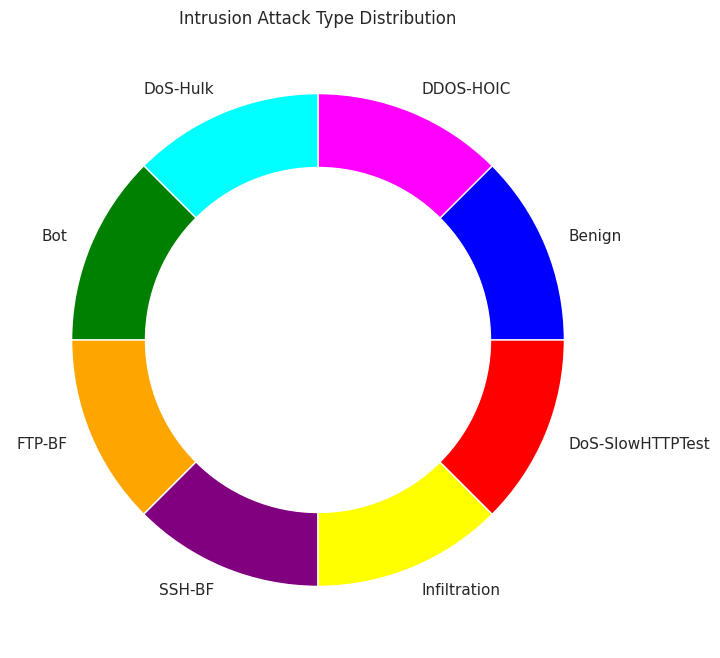

In [ ]:
plt.figure(figsize=(10, 8))
circle = plt.Circle((0, 0), 0.7, color='white')
plt.title('Intrusion Attack Type Distribution')
plt.pie(train_dataset['Label'].value_counts(), labels=['Benign', 'DDOS-HOIC', 'DoS-Hulk', 'Bot', 'FTP-BF', 'SSH-BF', 'Infiltration', 'DoS-SlowHTTPTest'], colors=['blue', 'magenta', 'cyan', 'green', 'orange', 'purple', 'yellow', 'red'])
p = plt.gcf()
p.gca().add_artist(circle)
plt.show()


**Making X & Y Variables (CNN)**

In [ ]:
test_dataset = train_dataset.sample(frac=0.1)
target_train = train_dataset['Label']
target_test = test_dataset['Label']
target_train.unique(), target_test.unique()

(array([0, 1, 2, 3, 4, 5, 6, 7]), array([6, 3, 5, 7, 1, 0, 2, 4]))

In [ ]:
from tensorflow.keras.utils import to_categorical

y_train = to_categorical(target_train, num_classes=8)
y_test = to_categorical(target_test, num_classes=8)


Data **Splicing**

In [ ]:
train_dataset = train_dataset.drop(columns = ["Timestamp", "Protocol","PSH Flag Cnt","Init Fwd Win Byts","Flow Byts/s","Flow Pkts/s", "Label"], axis=1)
test_dataset = test_dataset.drop(columns = ["Timestamp", "Protocol","PSH Flag Cnt","Init Fwd Win Byts","Flow Byts/s","Flow Pkts/s", "Label"], axis=1)

In [ ]:
# making train & test splits
X_train = train_dataset.iloc[:, :-1].values
X_test = test_dataset.iloc[:, :-1].values
X_test

array([[80, 2133168, 2, ..., 0.0, 0.0, 0],
       [80, 56549390, 203, ..., 0.0, 0.0, 0.0],
       [80, 119843426, 87796, ..., 0.0, 0.0, 0],
       ...,
       [8080, 11782, 3, ..., 0.0, 0.0, 0.0],
       [8080, 490, 2, ..., 0.0, 0.0, 0.0],
       [53, 499, 1, ..., 0.0, 0.0, 0.0]], dtype=object)

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(160000, 72)
(16000, 72)
(160000, 8)
(16000, 8)


In [ ]:
# reshape the data for CNN
X_train = X_train.reshape(len(X_train), X_train.shape[1], 1)
X_test = X_test.reshape(len(X_test), X_test.shape[1], 1)
X_train.shape, X_test.shape

((160000, 72, 1), (16000, 72, 1))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, BatchNormalization, MaxPooling1D, GlobalAveragePooling1D, Dense

def model():
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=6, activation='relu',
                     padding='same', input_shape=(72, 1)))
    model.add(BatchNormalization())

    # Adding a pooling layer
    model.add(MaxPooling1D(pool_size=3, strides=2, padding='same'))

    model.add(Conv1D(filters=64, kernel_size=6, activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=3, strides=2, padding='same'))

    # Global Average Pooling to reduce dimensions
    model.add(GlobalAveragePooling1D())

    # Fully connected layers
    model.add(Dense(64, activation='relu'))
    model.add(Dense(64, activation='relu'))

    # Final output layer with 8 units for 8 classes
    model.add(Dense(8, activation='softmax'))

    # Compile the model with categorical crossentropy for multiclass classification
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    return model


In [ ]:
model = model()
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                      │ (None, 72, 64)              │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 72, 64)              │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d (MaxPooling1D)         │ (None, 36, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1d_1 (Conv1D)                    │ (None, 36, 64)              │          24,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 36, 64)              │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_1 (MaxPooling1D)       │ (None, 18, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling1d             │ (None, 64)                  │               0 │
│ (GlobalAveragePooling1D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │             520 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 34,440 (134.53 KB)

 Trainable params: 34,184 (133.53 KB)

 Non-trainable params: 256 (1.00 KB)

In [ ]:
import numpy as np

# Ensure inputs are NumPy arrays
X_train = np.array(X_train, dtype=np.float32)
X_test = np.array(X_test, dtype=np.float32)

# Ensure labels are categorical (if necessary)
y_train = np.array(y_train, dtype=np.int32)
y_test = np.array(y_test, dtype=np.int32)


In [ ]:
logger = CSVLogger('logs.csv', append=True)
his = model.fit(X_train, y_train, epochs=30, batch_size=32,
          validation_data=(X_test, y_test), callbacks=[logger])



Epoch 1/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 86s 17ms/step - accuracy: 0.5442 - loss: 1.0898 - val_accuracy: 0.4409 - val_loss: 1.6413
Epoch 2/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 139s 16ms/step - accuracy: 0.7872 - loss: 0.5370 - val_accuracy: 0.8091 - val_loss: 0.4515
Epoch 3/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 80s 16ms/step - accuracy: 0.8254 - loss: 0.4228 - val_accuracy: 0.8388 - val_loss: 0.3863
Epoch 4/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 84s 16ms/step - accuracy: 0.8340 - loss: 0.4024 - val_accuracy: 0.7028 - val_loss: 0.8464
Epoch 5/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 81s 16ms/step - accuracy: 0.8399 - loss: 0.3870 - val_accuracy: 0.8487 - val_loss: 0.3335
Epoch 6/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 80s 16ms/step - accuracy: 0.8676 - loss: 0.3130 - val_accuracy: 0.8706 - val_loss: 0.2966
Epoch 7/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 83s 16ms/step - accuracy: 0.8679 - loss: 0.3125 - val_accuracy: 0.7046 - val_loss: 0.9696
Epoch 8/30
5000/5000 ━━━━━━━━━━━━━━━━━━━━ 79s 16ms/step - accuracy: 0.8689 

**Visualization of Results (CNN)**

In [ ]:
scores = model.evaluate(X_test, y_test)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1] * 100))

500/500 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9438 - loss: 0.1648
compile_metrics: 94.55%


In [ ]:
history = his.history
history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

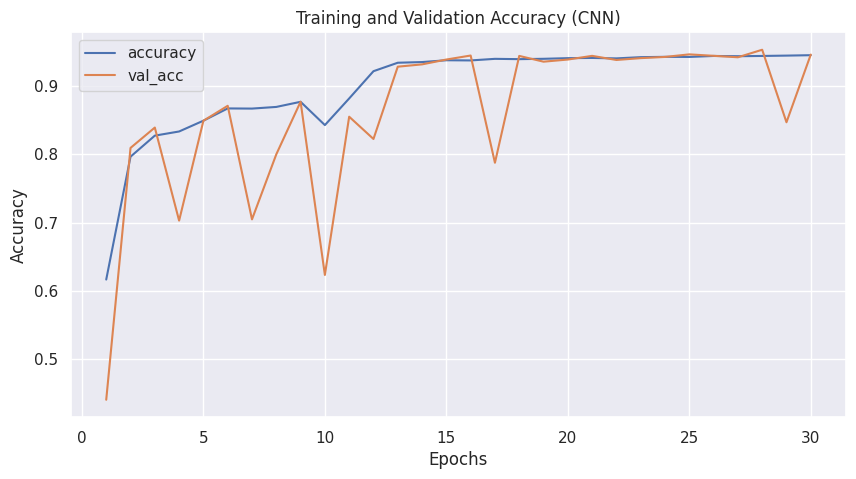

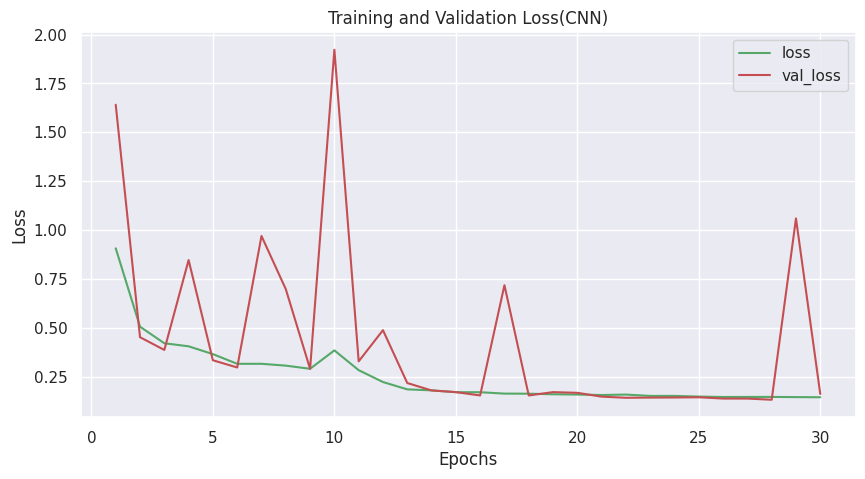

In [ ]:
epochs = range(1, len(history['loss']) + 1)
acc = history['accuracy']
loss = history['loss']
val_acc = history['val_accuracy']
val_loss = history['val_loss']

plt.figure(figsize=(10, 5))
plt.title('Training and Validation Accuracy (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.plot(epochs, acc, label='accuracy')
plt.plot(epochs, val_acc, label='val_acc')
plt.legend()

plt.figure(figsize=(10, 5))
plt.title('Training and Validation Loss(CNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.plot(epochs, loss, label='loss', color='g')
plt.plot(epochs, val_loss, label='val_loss', color='r')
plt.legend()

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Dense, Flatten, LSTM, GRU, SimpleRNN, Dropout
from tensorflow.keras.utils import to_categorical


In [ ]:
# One-hot encode target labels if needed
y_train = to_categorical(target_train)
y_test = to_categorical(target_test)


In [ ]:
cnn_rnn_model = Sequential()
cnn_rnn_model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
cnn_rnn_model.add(MaxPooling1D(pool_size=2))
cnn_rnn_model.add(SimpleRNN(64, return_sequences=True))
cnn_rnn_model.add(Flatten())
cnn_rnn_model.add(Dense(64, activation='relu'))
cnn_rnn_model.add(Dropout(0.5))
cnn_rnn_model.add(Dense(y_train.shape[1], activation='softmax'))

# Compile model
cnn_rnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train model
cnn_rnn_model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test))


Epoch 1/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 59s 22ms/step - accuracy: 0.7842 - loss: 0.5879 - val_accuracy: 0.9415 - val_loss: 0.1523
Epoch 2/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 59s 24ms/step - accuracy: 0.8907 - loss: 0.3004 - val_accuracy: 0.9473 - val_loss: 0.1253
Epoch 3/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 77s 22ms/step - accuracy: 0.8991 - loss: 0.2680 - val_accuracy: 0.9442 - val_loss: 0.1348
Epoch 4/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 56s 23ms/step - accuracy: 0.8990 - loss: 0.2698 - val_accuracy: 0.9410 - val_loss: 0.1671
Epoch 5/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 81s 22ms/step - accuracy: 0.8973 - loss: 0.2730 - val_accuracy: 0.9486 - val_loss: 0.1423
Epoch 6/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 82s 22ms/step - accuracy: 0.9005 - loss: 0.2657 - val_accuracy: 0.9434 - val_loss: 0.1349
Epoch 7/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 86s 24ms/step - accuracy: 0.9096 - loss: 0.2493 - val_accuracy: 0.9401 - val_loss: 0.1367
Epoch 8/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 77s 22ms/step - accuracy: 0.9132 -

In [ ]:
cnn_rnn_model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)                    │ (None, 70, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_2 (MaxPooling1D)       │ (None, 35, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn (SimpleRNN)               │ (None, 35, 64)              │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 2240)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │         143,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 8)                   │             520 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 457,370 (1.74 MB)

 Trainable params: 152,456 (595.53 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 304,914 (1.16 MB)

In [ ]:
accuracy = cnn_rnn_model.evaluate(X_test, y_test, verbose=0)[1]
print("CNN-RNN Model Accuracy:", accuracy)

CNN-RNN Model Accuracy: 0.948312520980835


In [ ]:
cnn_lstm_model = Sequential()
cnn_lstm_model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))
cnn_lstm_model.add(LSTM(64, return_sequences=True))
cnn_lstm_model.add(Flatten())
cnn_lstm_model.add(Dense(64, activation='relu'))
cnn_lstm_model.add(Dropout(0.5))
cnn_lstm_model.add(Dense(y_train.shape[1], activation='softmax'))

# Compile model
cnn_lstm_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train model
cnn_lstm_model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test))


Epoch 1/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 101s 40ms/step - accuracy: 0.8706 - loss: 0.3790 - val_accuracy: 0.9430 - val_loss: 0.1375
Epoch 2/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 96s 38ms/step - accuracy: 0.9314 - loss: 0.1767 - val_accuracy: 0.9469 - val_loss: 0.1174
Epoch 3/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 140s 38ms/step - accuracy: 0.9324 - loss: 0.1757 - val_accuracy: 0.9466 - val_loss: 0.1076
Epoch 4/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 96s 38ms/step - accuracy: 0.9357 - loss: 0.1639 - val_accuracy: 0.9486 - val_loss: 0.1185
Epoch 5/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 139s 37ms/step - accuracy: 0.9368 - loss: 0.1610 - val_accuracy: 0.9515 - val_loss: 0.1216
Epoch 6/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 143s 38ms/step - accuracy: 0.9427 - loss: 0.1444 - val_accuracy: 0.9582 - val_loss: 0.1002
Epoch 7/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 145s 39ms/step - accuracy: 0.9444 - loss: 0.1355 - val_accuracy: 0.9503 - val_loss: 0.1070
Epoch 8/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 139s 37ms/step - accuracy: 0.

In [ ]:
cnn_lstm_model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)                    │ (None, 70, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_3 (MaxPooling1D)       │ (None, 35, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 35, 64)              │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 2240)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 64)                  │         143,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 8)                   │             520 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 531,674 (2.03 MB)

 Trainable params: 177,224 (692.28 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 354,450 (1.35 MB)

In [ ]:
accuracy = cnn_lstm_model.evaluate(X_test, y_test, verbose=0)[1]
print("CNN-LSTM Model Accuracy:", accuracy)

CNN-LSTM Model Accuracy: 0.9495000243186951


In [ ]:
cnn_gru_model = Sequential()
cnn_gru_model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train.shape[1], 1)))
cnn_gru_model.add(MaxPooling1D(pool_size=2))
cnn_gru_model.add(GRU(64, return_sequences=True))
cnn_gru_model.add(Flatten())
cnn_gru_model.add(Dense(64, activation='relu'))
cnn_gru_model.add(Dropout(0.5))
cnn_gru_model.add(Dense(y_train.shape[1], activation='softmax'))

# Compile model
cnn_gru_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train model
cnn_gru_model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test))


Epoch 1/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 102s 40ms/step - accuracy: 0.8351 - loss: 0.4681 - val_accuracy: 0.9563 - val_loss: 0.1073
Epoch 2/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 97s 39ms/step - accuracy: 0.9259 - loss: 0.1896 - val_accuracy: 0.9557 - val_loss: 0.1164
Epoch 3/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 142s 39ms/step - accuracy: 0.9314 - loss: 0.1755 - val_accuracy: 0.9496 - val_loss: 0.1133
Epoch 4/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 142s 39ms/step - accuracy: 0.9286 - loss: 0.1820 - val_accuracy: 0.9503 - val_loss: 0.1208
Epoch 5/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 97s 39ms/step - accuracy: 0.9204 - loss: 0.2006 - val_accuracy: 0.9539 - val_loss: 0.1130
Epoch 6/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 142s 39ms/step - accuracy: 0.9351 - loss: 0.1640 - val_accuracy: 0.9498 - val_loss: 0.1255
Epoch 7/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 141s 39ms/step - accuracy: 0.9345 - loss: 0.1708 - val_accuracy: 0.9519 - val_loss: 0.1174
Epoch 8/10
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 141s 38ms/step - accuracy: 0.

In [ ]:
cnn_gru_model.summary()


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1d_4 (Conv1D)                    │ (None, 70, 64)              │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling1d_4 (MaxPooling1D)       │ (None, 35, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru (GRU)                            │ (None, 35, 64)              │          24,960 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 2240)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 64)                  │         143,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 8)                   │             520 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 507,482 (1.94 MB)

 Trainable params: 169,160 (660.78 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 338,322 (1.29 MB)

In [ ]:
accuracy = cnn_gru_model.evaluate(X_test, y_test, verbose=0)[1]
print("CNN-GRU Model Accuracy:", accuracy)

CNN-GRU Model Accuracy: 0.961187481880188
